In [1]:
import numpy as np

from model_ranking.utils import load_h5
from model_ranking.datasets import get_datasets
from model_ranking.dataclass import (
    HmitoTargetConfig,
)

INFO: P [MainThread] 2025-06-17 09:37:28,704 plantseg - Logger configured at initialisation. PlantSeg logger name: plantseg


In [2]:
import matplotlib.pyplot as plt
from numpy.typing import NDArray
from typing import Any

from model_ranking.utils import is_ndarray

def plot_random_zero_f1_samples(
    ids_zero_f1: NDArray[Any],
    preds: NDArray[Any],
    train_dataset: Any,
    num_samples: int = 5,
    seed: int = 42
) -> None:
    np.random.seed(seed)
    sampled_ids = np.random.choice(ids_zero_f1, size=num_samples, replace=False)
    
    for idx in sampled_ids:
        # Get prediction
        pred = preds[idx].squeeze()
        
        # Get raw image and label from dataset
        for dataset in train_dataset:
            raw, label = dataset[idx]
            raw = raw.numpy().squeeze()
            label = label.numpy().squeeze()
        
        assert is_ndarray(raw) and is_ndarray(label) and is_ndarray(pred), "All inputs must be numpy arrays." 
        
        _, axs = plt.subplots(1, 3, figsize=(12, 4))
        axs[0].imshow(raw, cmap='gray')
        axs[0].set_title('Raw Image')
        axs[1].imshow(label, cmap='gray')
        axs[1].set_title('Ground Truth')
        axs[2].imshow(pred, cmap='gray')
        axs[2].set_title('Prediction')
        for ax in axs:
            ax.axis('off')
        plt.tight_layout()
        plt.show()

In [3]:
path = "/g/kreshuk/talks/model_ranking_results/Self-Finetuning/Mitochondria/EPFL_to_Hmito_gap/feature_perturbation/train_predictions/EtoH_DO_a02_model1/epoch-0/predictions/train_predictions.h5"
preds = load_h5(path, "predictions")

In [4]:
consis_score_path = "/g/kreshuk/talks/model_ranking_results/Self-Finetuning/Mitochondria/EPFL_to_Hmito_gap/feature_perturbation/pseudo_labeler/EtoH_DO_a02_model1/09_consis_threshold_EI/patch_selection_best_checkpoint.npz"
consis_scores = np.load(consis_score_path)["consis_scores"]

In [5]:
print(consis_scores.shape)

(3750,)


In [6]:
eval_scores = load_h5(path, "F1_eval")

In [7]:
train_dataset, _ = get_datasets(
    HmitoTargetConfig(), 
    "train",
)

2025-06-17 09:37:52,978 [MainThread] INFO HDF5Dataset - Loading train set from: /scratch/talks/data/Hmito/train.h5...
2025-06-17 09:37:52,979 [MainThread] INFO HDF5Dataset - Calculating mean and std of the raw data...
Global mean: 145.08239663085936, global std: 48.57221913786601
2025-06-17 09:38:35,072 [MainThread] INFO Dataset - Slice builder config: {'name': 'SliceBuilder', 'patch_shape': (1, 256, 256), 'stride_shape': (1, 256, 256), 'halo_shape': (0, 0, 0)}
2025-06-17 09:38:35,149 [MainThread] INFO HDF5Dataset - Number of patches: 3750


# Zero F1 predictions

In [23]:
ids_zero_f1 = np.where(eval_scores[:,1] == 0)[0]
print(f"Number of patches with zero F1: {len(ids_zero_f1)}")

Number of patches with zero F1: 656


In [ ]:
ids_consis_08 = np.where(consis_scores >= 0.8)[0]
print(f"Number of patches with F1 >= 0.8: {len(ids_consis_08)}")

Number of patches with F1 >= 0.8: 1479


In [31]:
intersection = np.intersect1d(ids_consis_08, ids_zero_f1)
print(f"Number of patches with F1 >= 0.8 and zero F1: {len(intersection)}")


Number of patches with F1 >= 0.8 and zero F1: 18


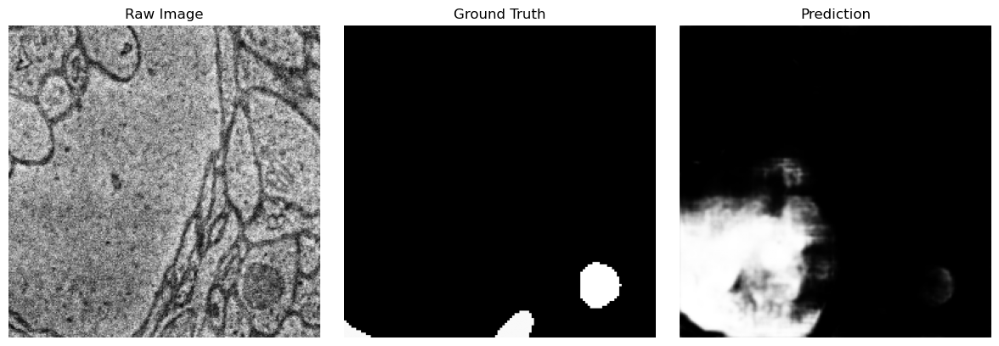

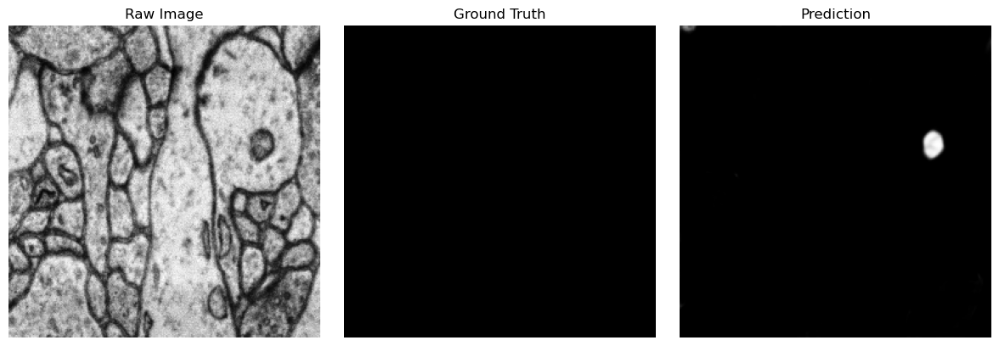

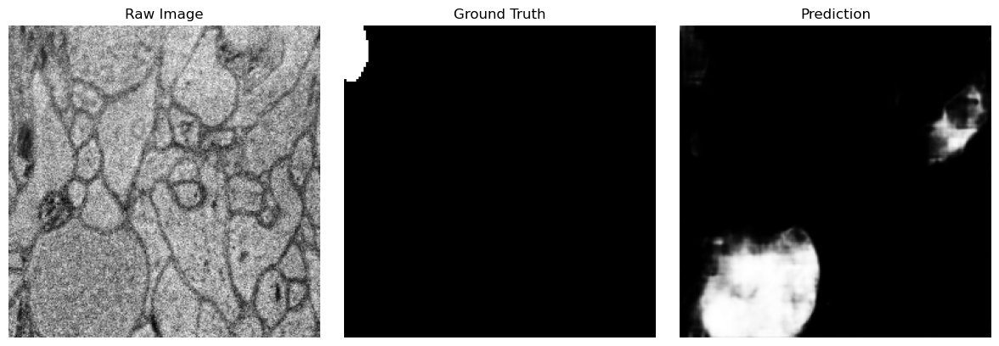

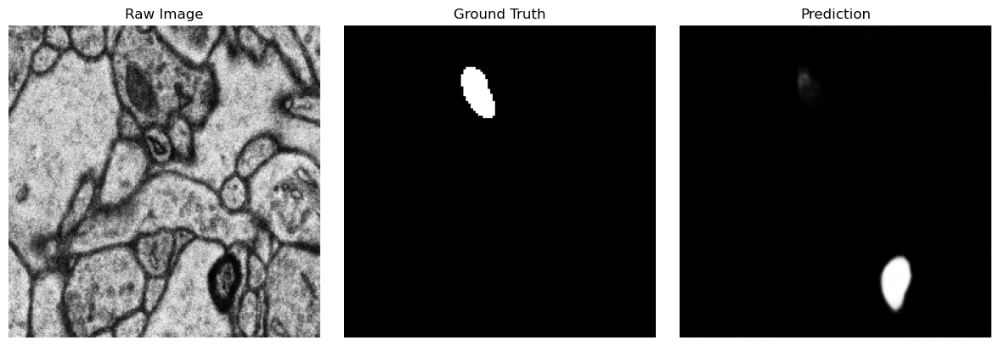

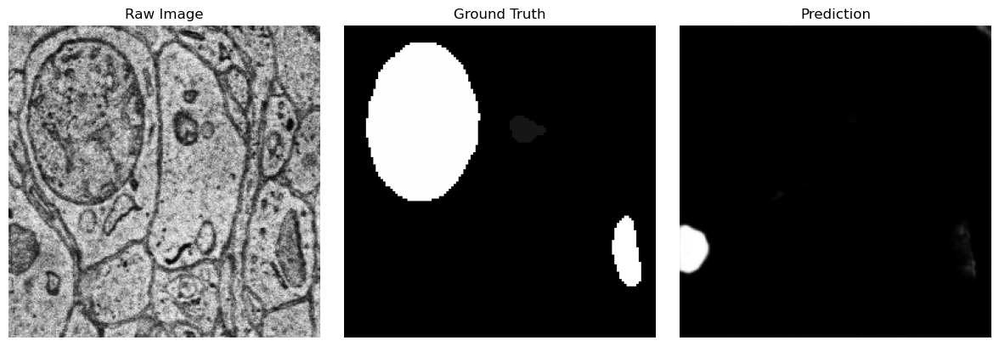

...

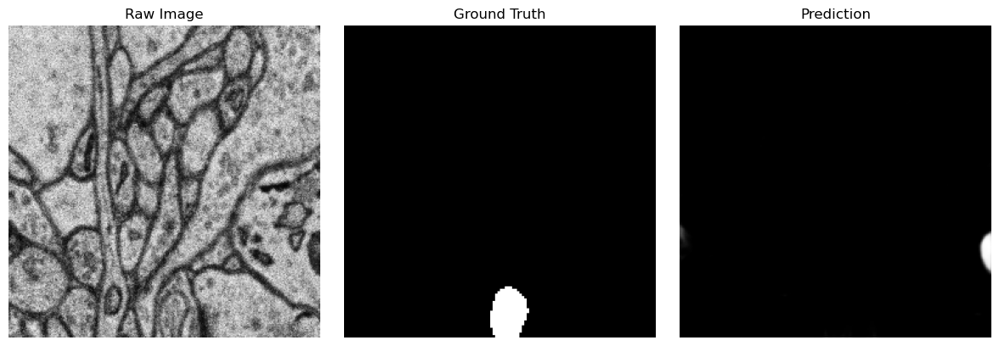

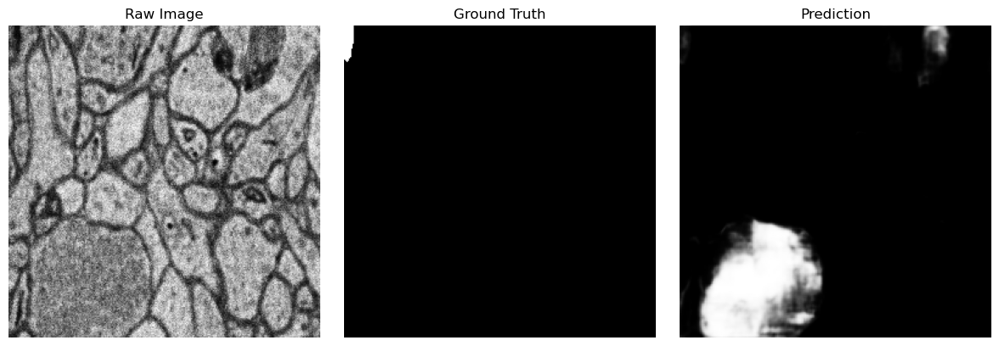

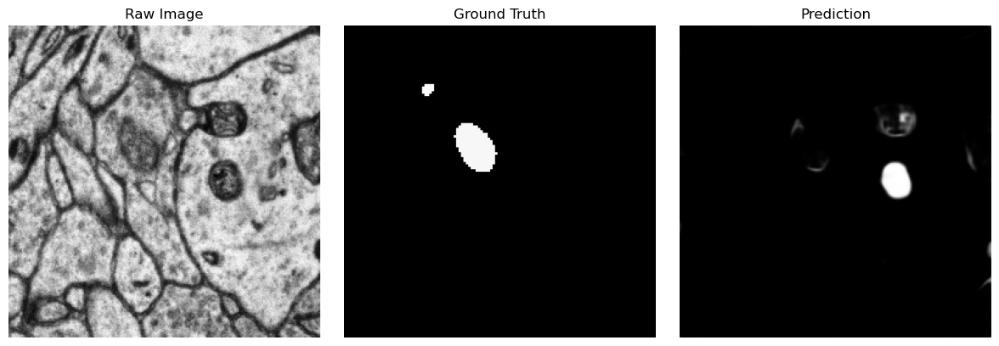

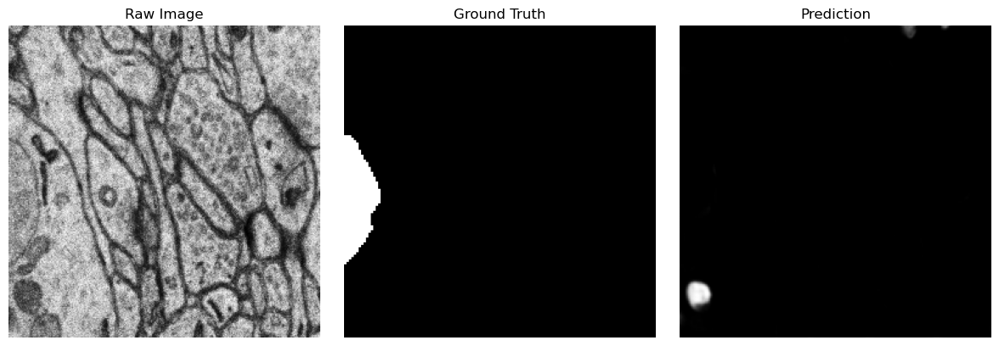

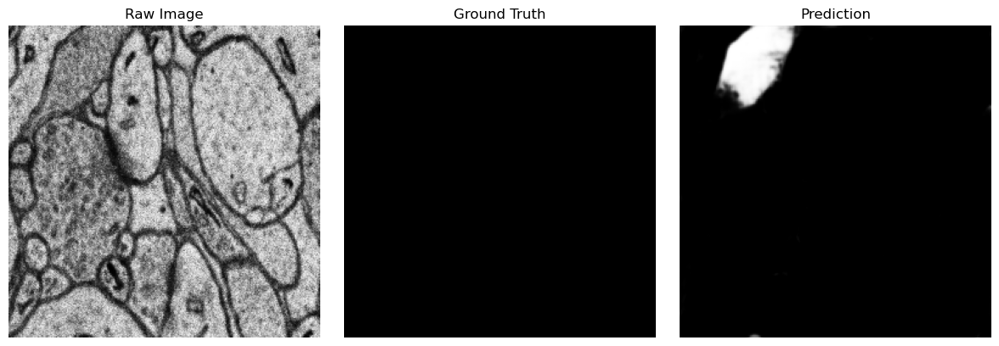

In [32]:
plot_random_zero_f1_samples(intersection, preds, train_dataset, num_samples=18, seed=42)

In [34]:
ids_consis_04_05 = np.where((consis_scores >= 0.4) & (consis_scores <= 0.5))[0]
print(f"Number of patches with F1 >= 0.4 <= 0.5: {len(ids_consis_04_05)}")

Number of patches with F1 >= 0.4 <= 0.5: 194


In [35]:
intersection = np.intersect1d(ids_consis_04_05, ids_zero_f1)
print(f"Number of patches with F1 >= 0.8 and zero F1: {len(intersection)}")


Number of patches with F1 >= 0.8 and zero F1: 39


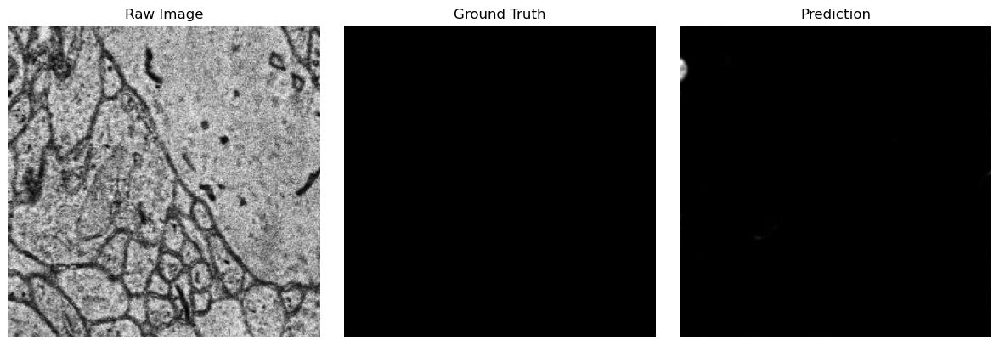

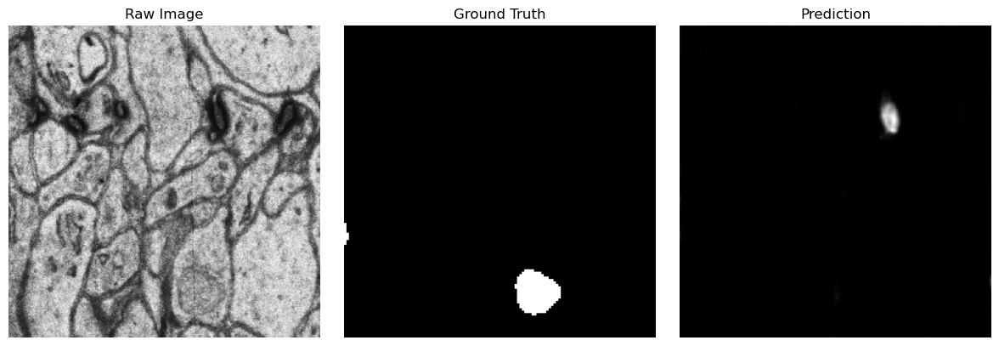

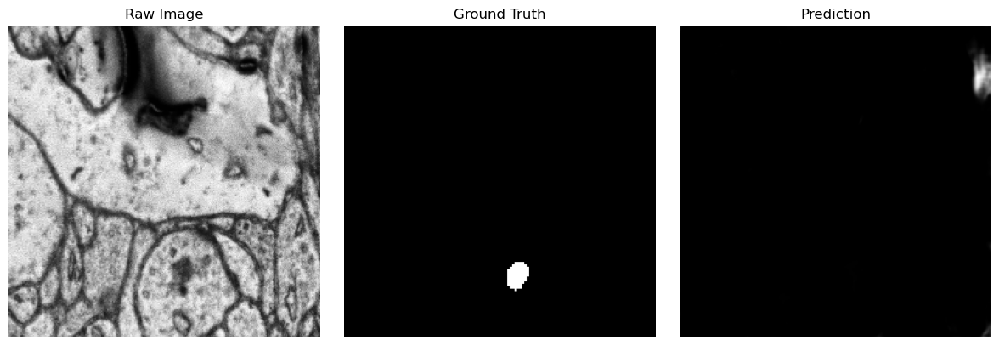

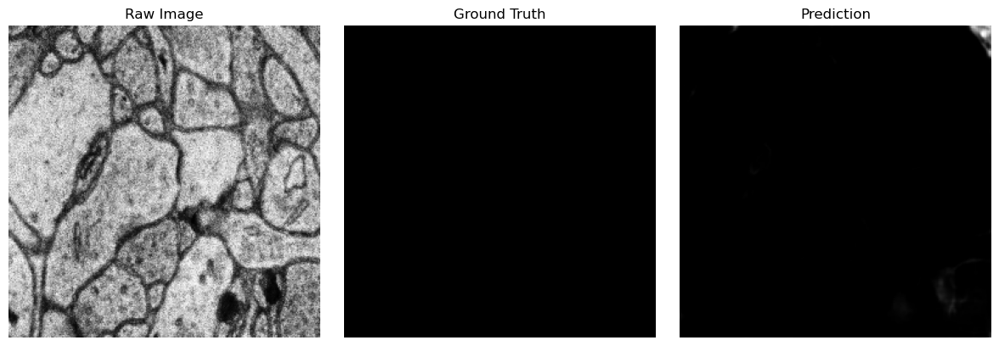

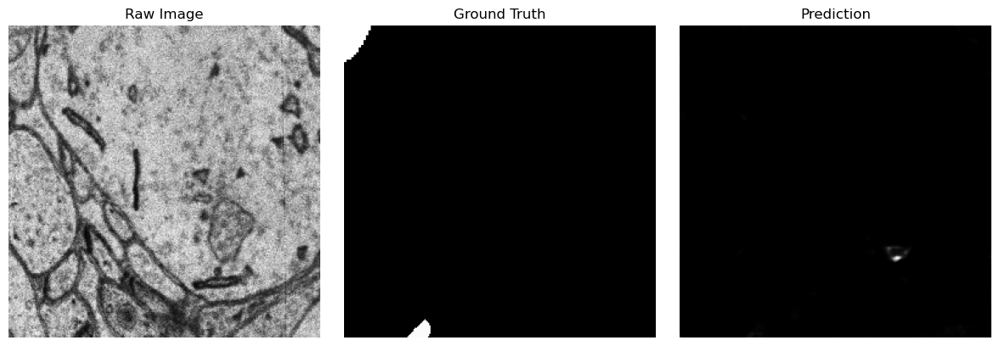

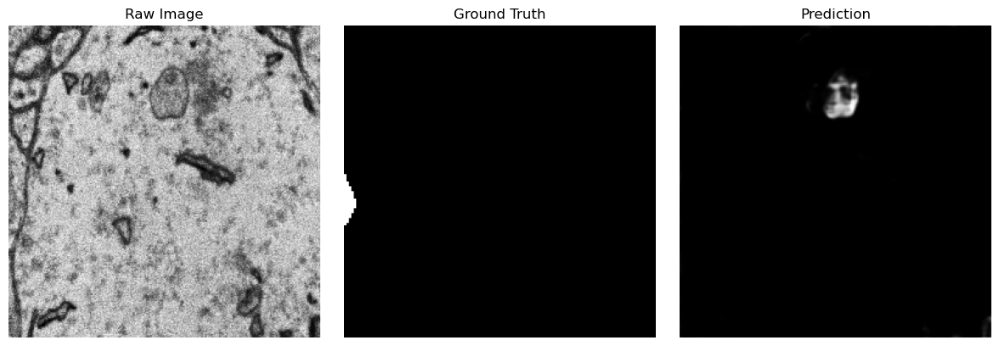

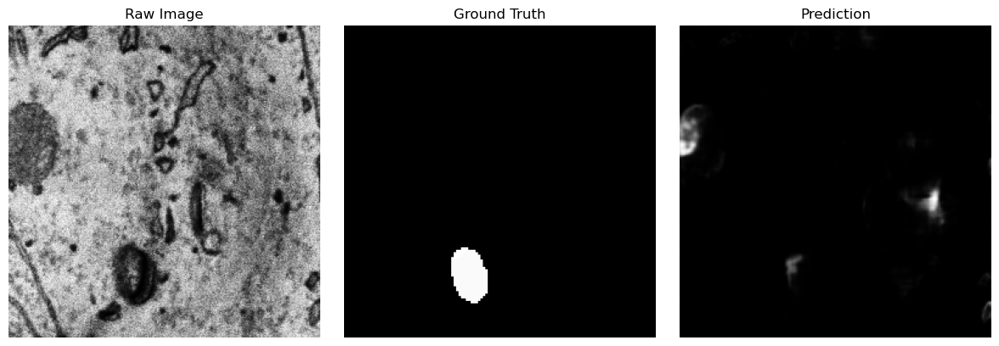

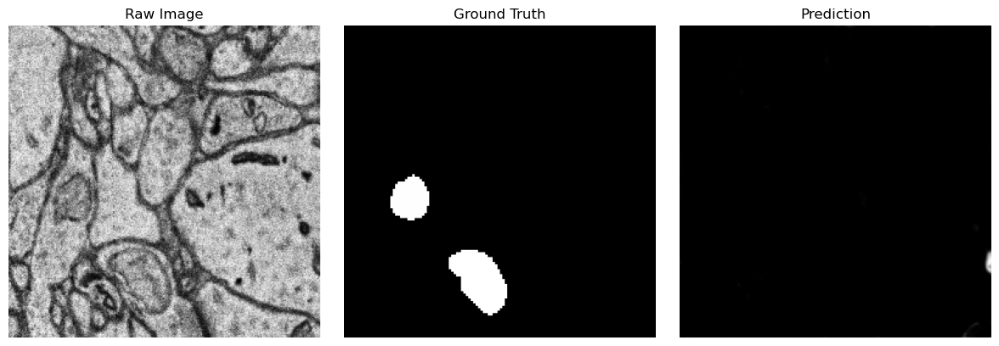

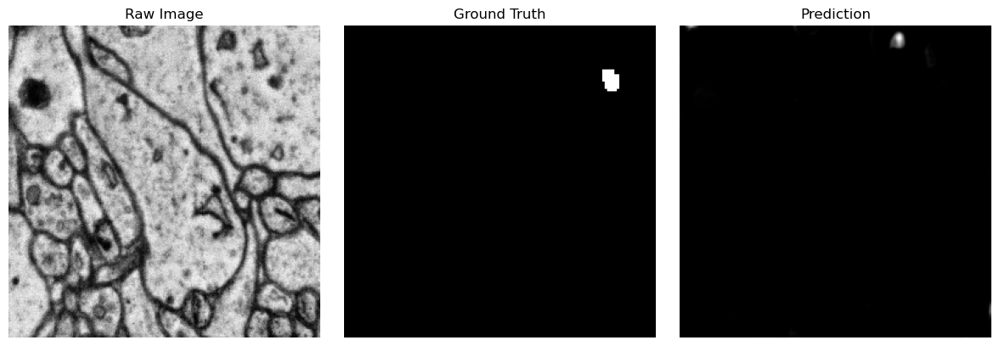

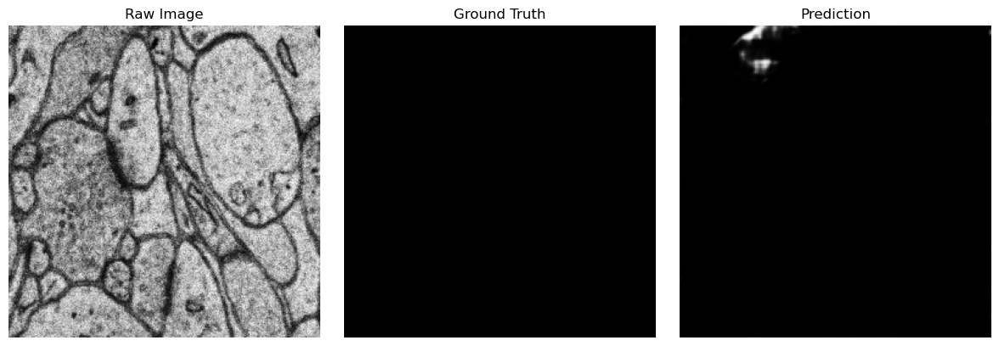

In [36]:
plot_random_zero_f1_samples(intersection, preds, train_dataset, num_samples=10, seed=42)

# consis >= 0.8,  0.4 <= F1 <= 0.6

In [8]:
ids_consis_08 = np.where(consis_scores >= 0.8)[0]
print(f"Number of patches with F1 >= 0.8: {len(ids_consis_08)}")

Number of patches with F1 >= 0.8: 1479


In [12]:
ids_f1_04_06 = np.where((eval_scores[:,1] >= 0.4) & (eval_scores[:,1] <= 0.6))[0]
print(f"Number of patches with zero F1: {len(ids_f1_04_06)}")

Number of patches with zero F1: 691


In [13]:
intersection = np.intersect1d(ids_consis_08, ids_f1_04_06)
print(f"Number of patches with F1 >= 0.8 and zero F1: {len(intersection)}")

Number of patches with F1 >= 0.8 and zero F1: 244


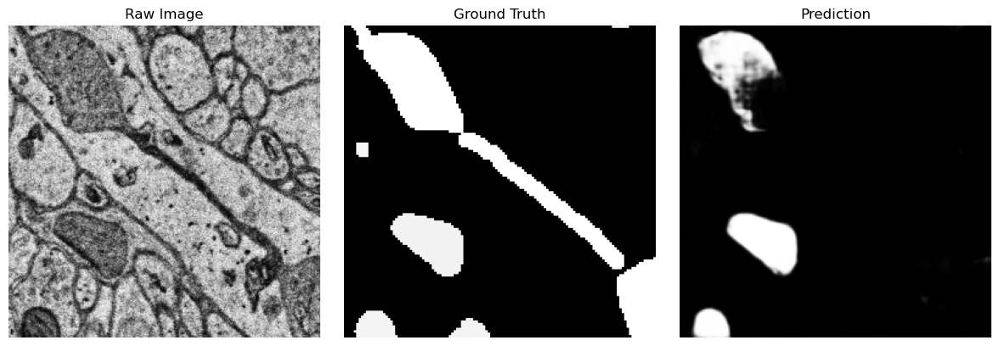

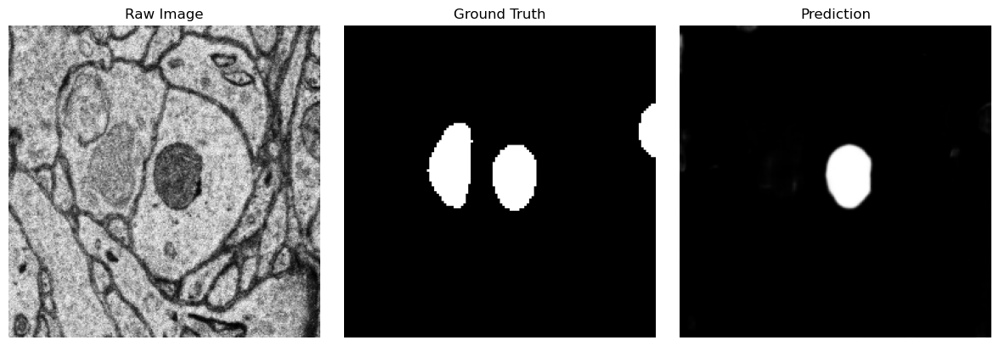

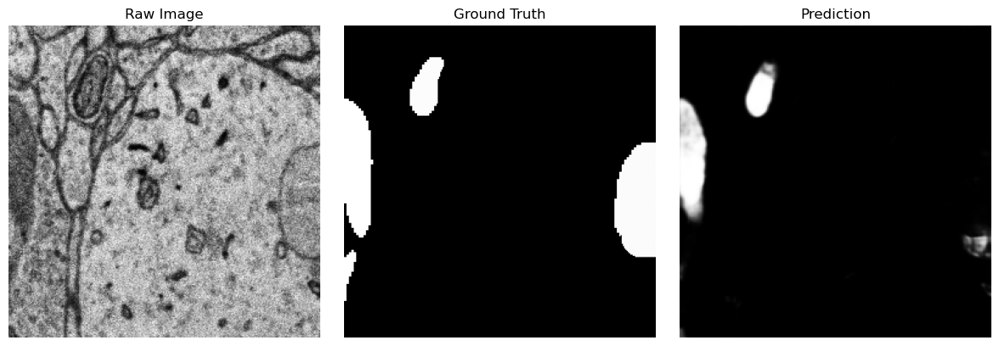

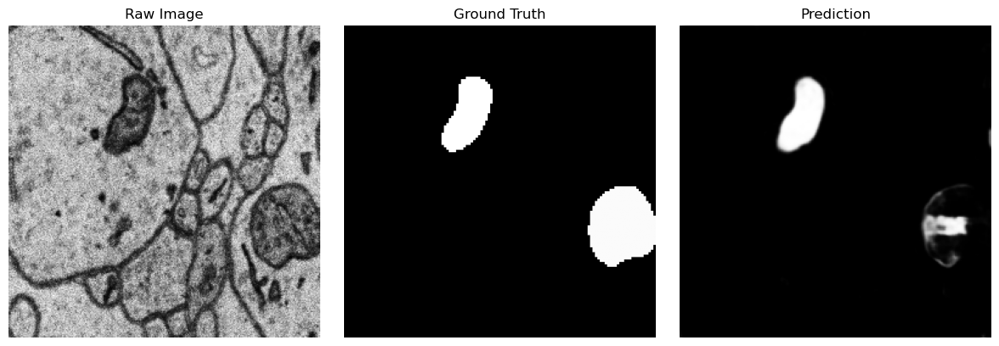

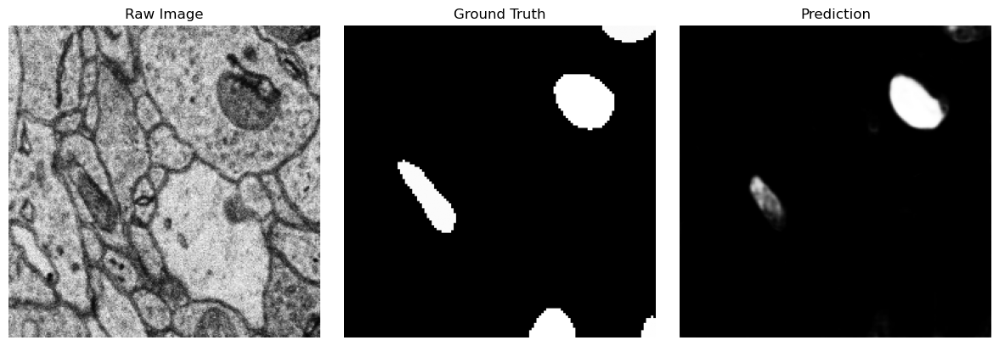

...

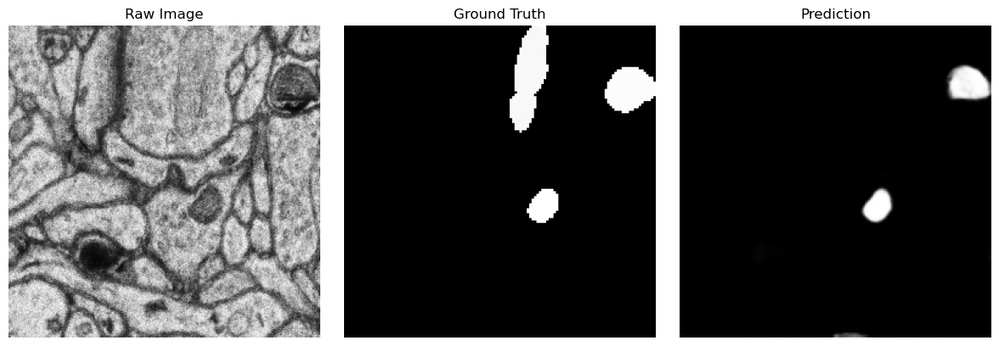

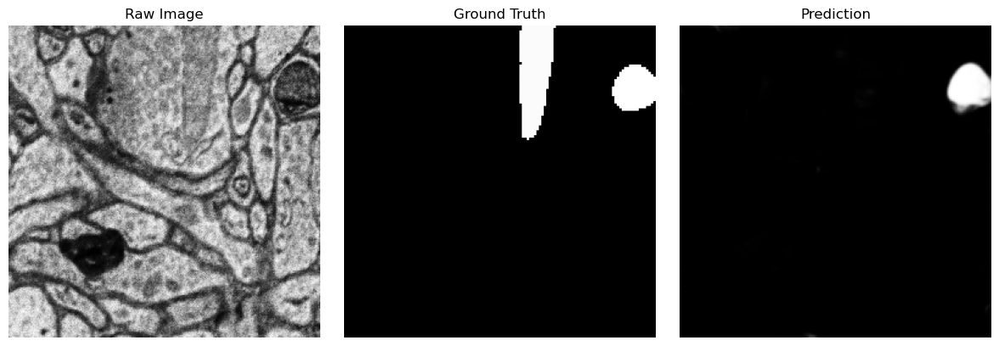

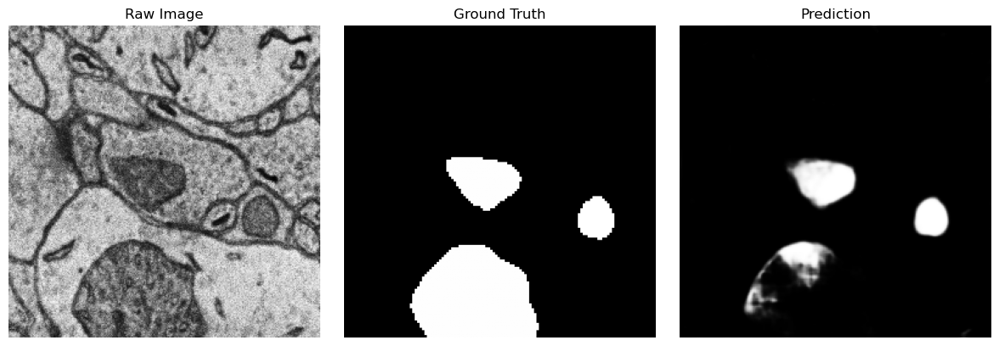

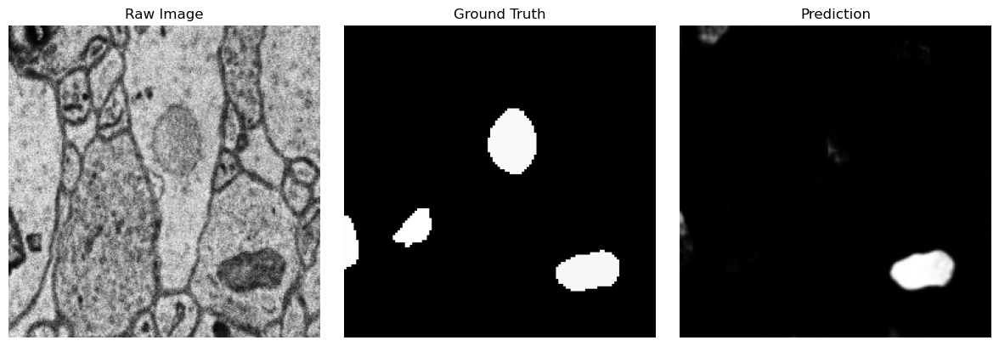

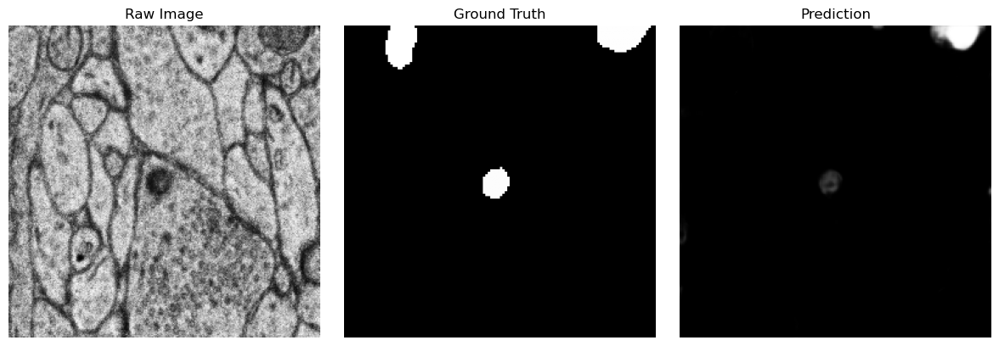

In [15]:
plot_random_zero_f1_samples(intersection, preds, train_dataset, num_samples=30, seed=1)